In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

import pickle
# impor

In [2]:
data_filepaths = '../data/final_full_dataset.pkl'

with open(data_filepaths, 'rb') as file: # getting used to writing it this way so i dont get lazy
    data = pickle.load(file)
    file.close()
    
data.head()

,num_weeks,duration_ms,explicit,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,...,genre_uk pop,genre_underground hip hop,genre_urban contemporary,genre_vapor trap,genre_viral pop,genre_viral trap,genre_vocal jazz,genre_west coast rap,genre_west coast trap,genre_yacht rock
0,12,255560.0,True,72.0,0.1180,0.796,0.500,0.000000,1,0.155,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,20,210200.0,True,76.0,0.0317,0.822,0.505,0.000911,7,0.114,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,234666.0,True,61.0,0.7380,0.781,0.810,0.000000,10,0.144,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,15,222706.0,True,65.0,0.2740,0.836,0.776,0.000000,4,0.113,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2,225893.0,True,75.0,0.2470,0.888,0.515,0.000000,1,0.446,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### ALL THE PAIRPLOTS YEET.

In [6]:
not_one_hot = [column for column in data.columns if 'artist' not in column and 'genre' not in column]
not_one_hot.remove('explicit')
not_one_hot

['num_weeks',
 'duration_ms',
 'popularity',
 'acousticness',
 'danceability',
 'energy',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'speechiness',
 'tempo',
 'time_signature',
 'valence',
 'duration',
 'end_of_fade_in',
 'key_confidence',
 'mode_confidence',
 'num_samples',
 'offset_seconds',
 'start_of_fade_out',
 'tempo_confidence',
 'time_signature_confidence',
 'window_seconds',
 'aritst_popularity_score']

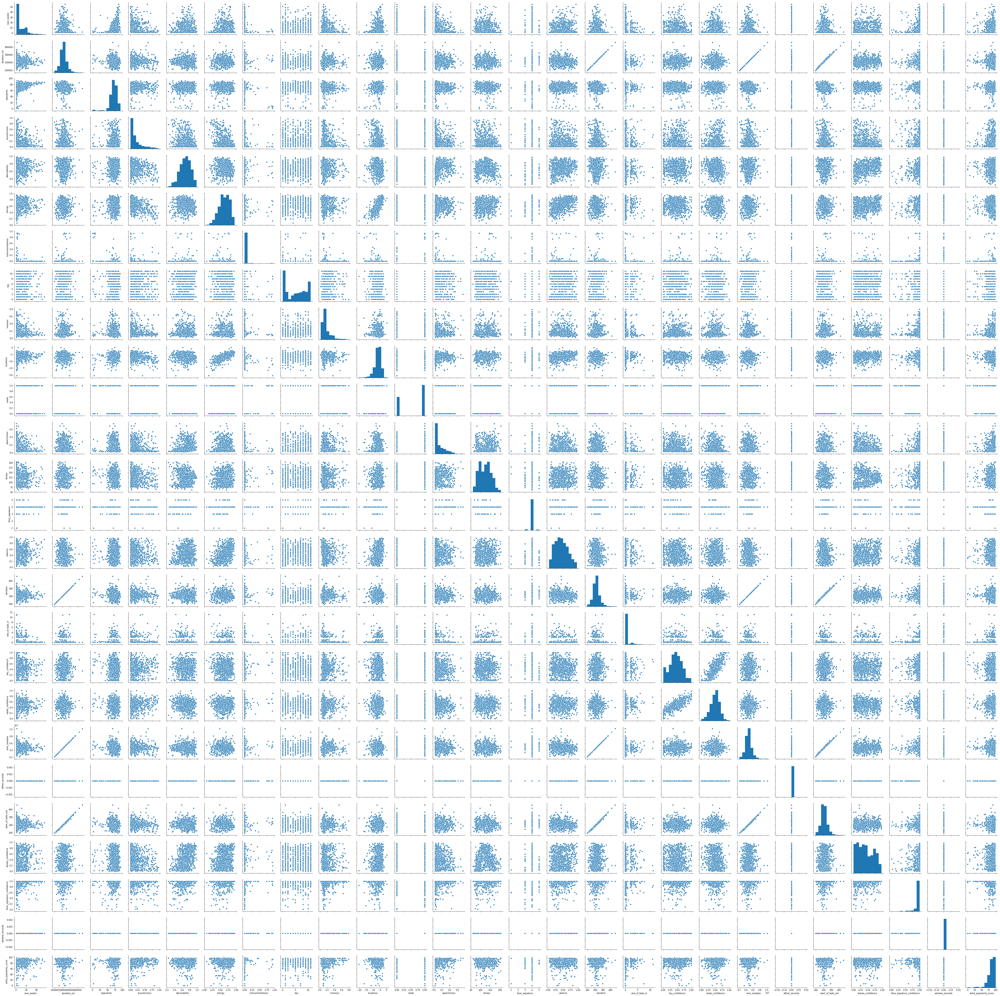

In [7]:
# Draw scatterplots for joint relationships and histograms for univariate distributions:
sns.pairplot(data[not_one_hot])

#### Feature selection: picking out things that dont provide signal

dropping start_of_fade_out, end_of_fade_in because there is no documentation of what this means so i dont know how to intepret it 

dropping window_seconds, and offset_seconds because no variance therefore no signal since its the same for all observations lmao

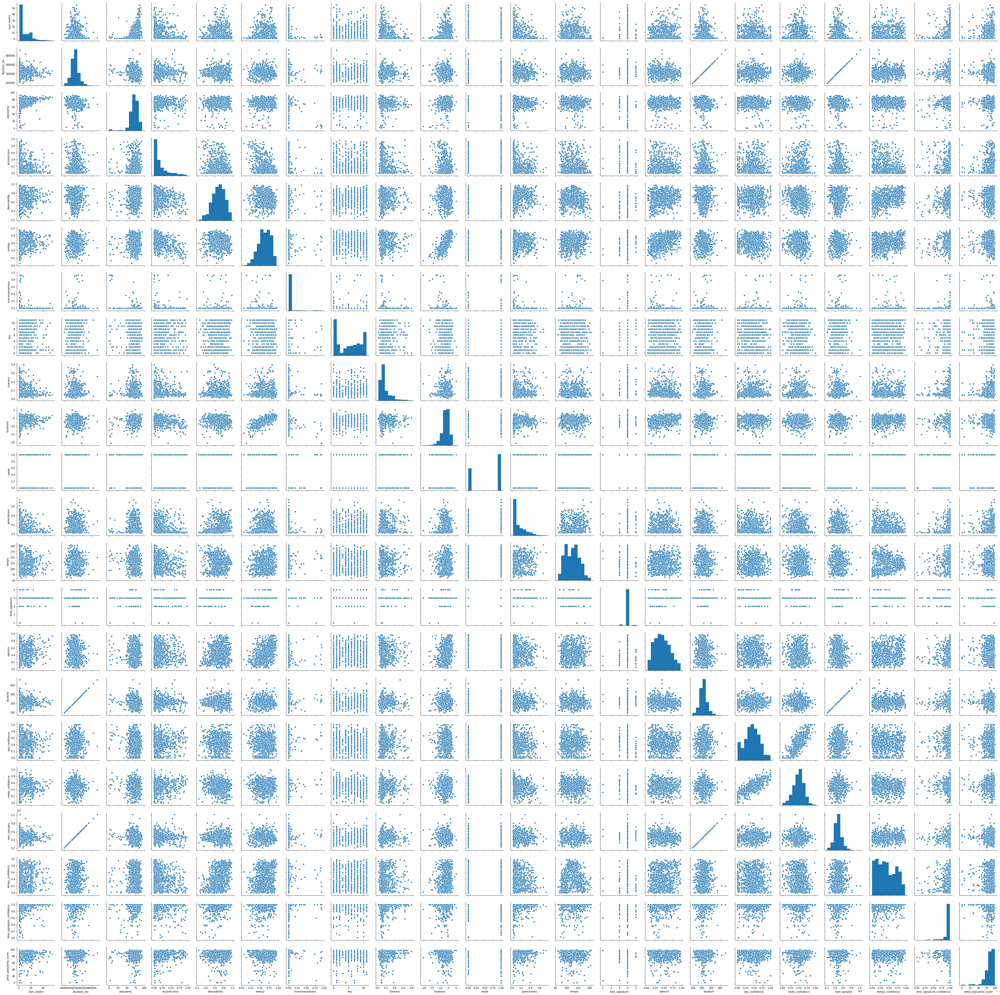

In [8]:
# columns that are useless bc no signal, doesn't make sense etc etc
useless = ['start_of_fade_out', 'end_of_fade_in', 'window_seconds', 'offset_seconds']
data.drop(useless, axis=1, inplace=True)

# NTS the key is categorical and therefore needs to be hot encoded, and one of the dummies needs to be dropped 
# to ensure that no information is leaked

not_one_hot = [column for column in data.columns if 'artist' not in column and 'genre' not in column]
not_one_hot.remove('explicit')
# not_one_hot
sns.pairplot(data[not_one_hot])

dropping number of samples because it doesnt provide signal
dropping popularity because its dependent on time and would introduce bias into the dataset (querying from spotify api)

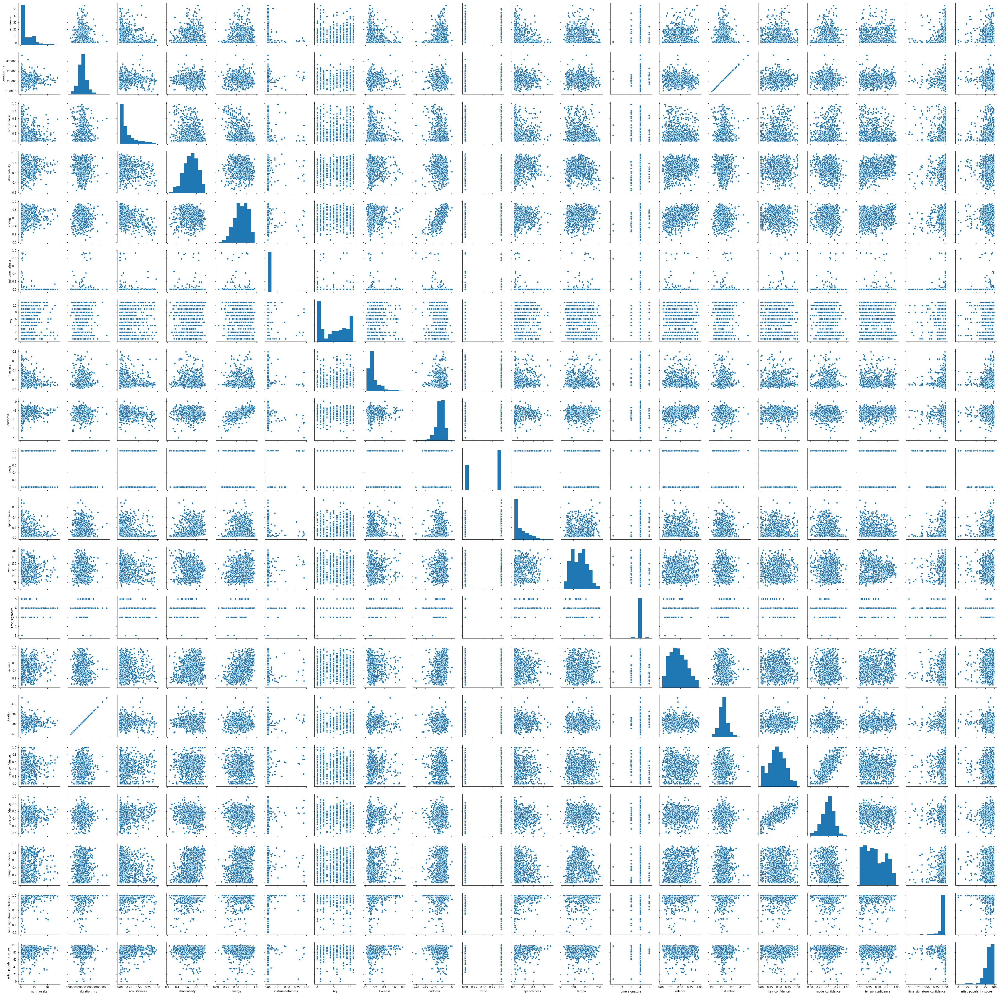

In [9]:
# columns that are useless bc no signal, doesn't make sense etc etc
useless = ['num_samples', 'popularity'] # dropping popularity because its time sensitive and i dont want that 
data.drop(useless, axis=1, inplace=True)

# NTS the key is categorical and therefore needs to be hot encoded, and one of the dummies needs to be dropped 
# to ensure that no information is leaked

not_one_hot = [column for column in data.columns if 'artist' not in column and 'genre' not in column]
not_one_hot.remove('explicit')
# not_one_hot
sns.pairplot(data[not_one_hot])

Something interesting: there seems to be a relationship with energy and loudness
- also relationship with mode_confidence and key_confidence which means that there might be something about the song that influences the confidence of the algorithm, it would be interesting to see what that 'something' is about the song

also need to drop duration because it's the same as duration_ms

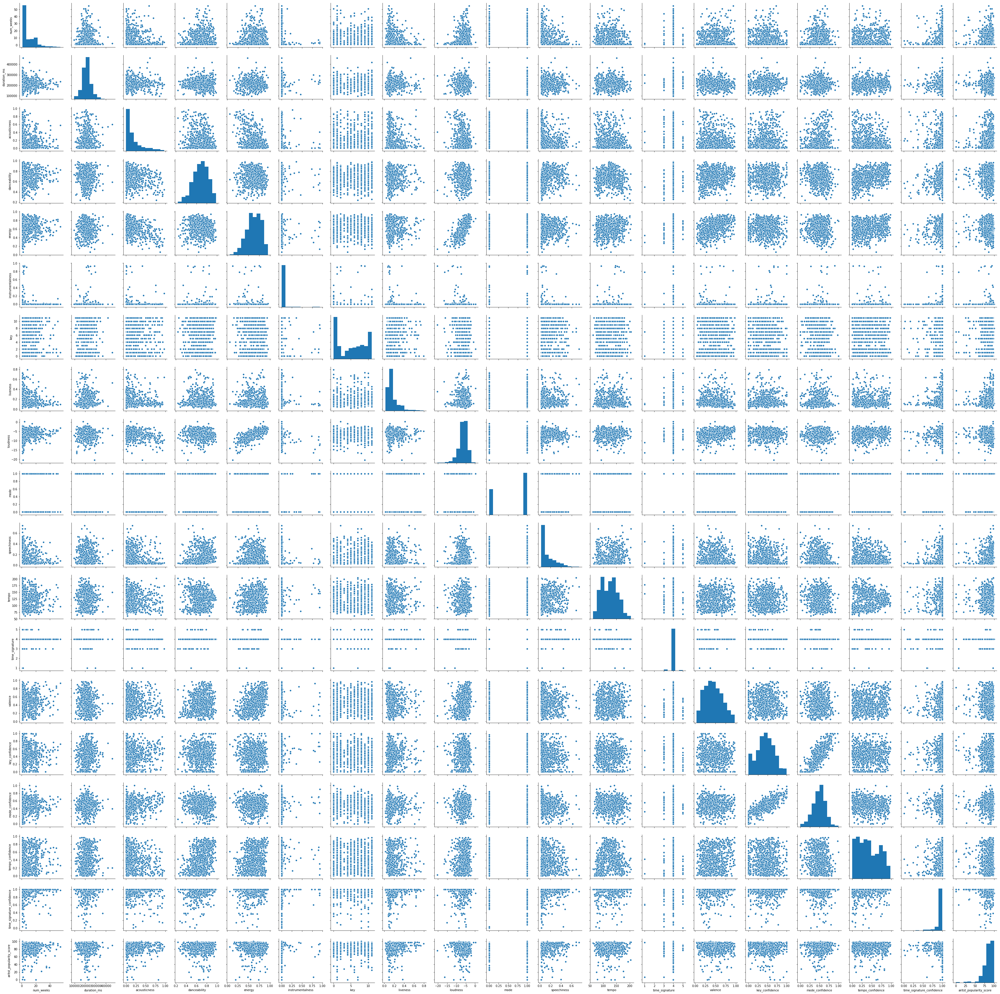

In [10]:
# columns that are useless bc no signal, doesn't make sense etc etc
useless = ['duration'] 
data.drop(useless, axis=1, inplace=True)

# NTS the key is categorical and therefore needs to be hot encoded, and one of the dummies needs to be dropped 
# to ensure that no information is leaked

not_one_hot = [column for column in data.columns if 'artist' not in column and 'genre' not in column]
not_one_hot.remove('explicit') # because it throws an error
# not_one_hot
sns.pairplot(data[not_one_hot]);

After reading the documentation, I think that energy captures some of the information that loudness provides, so I think it's better that I just drop loudness and keep energy 

What i've learned so far, this requires a lot of domain knowledge and understanding your data: what it can tell you, and what it can't tell you. What i think would be important and if i can get the data that captures what i think is important

this is also an iterative process where i go back and forth and try to interpret what the data is telling me

In [11]:
useless = ['loudness'] 
data.drop(useless, axis=1, inplace=True)

In [13]:
pickle.dump(data, open('../data/final_features_before_polynomial.pkl', 'wb'))

### Polynomial to see if that makes a difference in my ability to increase r2

In [14]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
poly = PolynomialFeatures(2)
X_quad = poly.fit_transform(X_scaled)
X_features = np.concatenate([X_quad, X.iloc[:,-8:]], axis=1)